In [2]:
import cv2
import imutils as imutils
import numpy as np
import os
import shutil
from skimage import io
from skimage.metrics import structural_similarity
import matplotlib.pyplot as plt
import numpy as np

In [3]:
# vidPath = 'C:\\Users\\killi\\Computing work\\trains\\trainvis\\ml\\img\\vid2pano'
vidPath = 'C:\\Users\\Bazinga\\GDP_Trains\\Git_Group\\AutoSign\\ml\\img\\vid2pano'

lightPath = os.path.join(vidPath, 'light.mp4')
darkPath = os.path.join(vidPath, 'dark.mp4')

lightOut = os.path.join(vidPath, 'light\\')
darkOut = os.path.join(vidPath, 'dark\\')

In [4]:
lightVid = cv2.VideoCapture(lightPath)
darkVid = cv2.VideoCapture(darkPath)

In [5]:
lightFrames = []
darkFrames = []

for filename in os.listdir(lightOut):
    f = os.path.join(lightOut, filename)
    # checking if it is a file
    if os.path.isfile(f):
        lightFrames.append(f)

for filename in os.listdir(darkOut):
    f = os.path.join(darkOut, filename)
    # checking if it is a file
    if os.path.isfile(f):
        darkFrames.append(f)

lightFrames.sort(key=lambda x :  int("".join(filter(str.isdigit, os.path.basename(x)))))
darkFrames.sort(key=lambda x : int("".join(filter(str.isdigit, os.path.basename(x)))))

print([os.path.basename(i) for i in lightFrames])

['frame-0.jpg', 'frame-1.jpg', 'frame-2.jpg', 'frame-3.jpg', 'frame-4.jpg', 'frame-5.jpg', 'frame-6.jpg', 'frame-7.jpg', 'frame-8.jpg', 'frame-9.jpg', 'frame-10.jpg', 'frame-11.jpg', 'frame-12.jpg', 'frame-13.jpg', 'frame-14.jpg', 'frame-15.jpg', 'frame-16.jpg', 'frame-17.jpg', 'frame-18.jpg', 'frame-19.jpg', 'frame-20.jpg', 'frame-21.jpg', 'frame-22.jpg', 'frame-23.jpg', 'frame-24.jpg', 'frame-25.jpg', 'frame-26.jpg', 'frame-27.jpg', 'frame-28.jpg', 'frame-29.jpg', 'frame-30.jpg', 'frame-31.jpg', 'frame-32.jpg', 'frame-33.jpg', 'frame-34.jpg', 'frame-35.jpg', 'frame-36.jpg', 'frame-37.jpg', 'frame-38.jpg', 'frame-39.jpg', 'frame-40.jpg', 'frame-41.jpg', 'frame-42.jpg', 'frame-43.jpg', 'frame-44.jpg', 'frame-45.jpg', 'frame-46.jpg', 'frame-47.jpg', 'frame-48.jpg', 'frame-49.jpg', 'frame-50.jpg', 'frame-51.jpg', 'frame-52.jpg', 'frame-53.jpg', 'frame-54.jpg', 'frame-55.jpg', 'frame-56.jpg', 'frame-57.jpg', 'frame-58.jpg', 'frame-59.jpg', 'frame-60.jpg', 'frame-61.jpg', 'frame-62.jpg', '

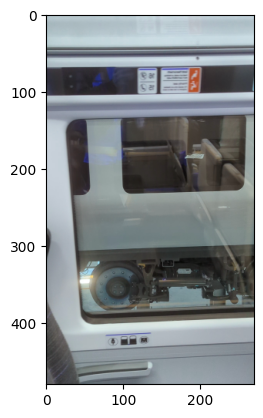

In [115]:
def preProcessIms(files):

    ims = []

    for name in files:
        nextIm = cv2.imread(name, cv2.COLOR_YUV2GRAY_420)
        # nextIm = cv2.rotate(nextIm, cv2.ROTATE_90_CLOCKWISE)

        scale_percent = 60 # % of original size
        w = int(nextIm.shape[1] * scale_percent / 100)
        h = int(nextIm.shape[0] * scale_percent / 100)

        dim = (w,h)
        # nextIm = cv2.resize(nextIm, dim, interpolation = cv2.INTER_AREA)
        ims.append(nextIm)

    return ims

# Removes frames with more than 50% similarity
def removeSimilarImages(ims):
    
    threshold = 0.5
    goodImages = []
    goodImages.append(ims[0])
    imgToCompare = ims[0]
    for currentImage in ims:
    
        score = structural_similarity(imgToCompare, currentImage, multichannel=True)
        print(score)
        if(score < threshold):
            goodImages.append(currentImage)
            imgToCompare = currentImage
    return goodImages
        
skipIms = preProcessIms(lightFrames)[::3]

# goodImages = []
# goodImages.append(skipIms[0])
# imgToCompare = skipIms[0]
# for currentImage in skipIms:
#     
#     score = structural_similarity(imgToCompare, currentImage, multichannel=True)
#     print(score)
#     if(score < 0.5):
#         print("keep image")
#         plt.imshow(imgToCompare)
#         plt.show()
#         
#         plt.imshow(currentImage)
#         plt.show()
#         
#         goodImages.append(currentImage)
#         imgToCompare = currentImage

        
        
# print('chosen frames count: ', len(skipIms), len(goodImages))

plt.imshow(skipIms[0])
#plt.show()

plt.imshow(skipIms[1])
# plt.show()

plt.imshow(skipIms[2])
# plt.show()

In [7]:
def detectAndDescribe(image, method=None):

    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()

    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)

    return (kps, features)

In [8]:
def instMatcher(algo, crosscheck):
    if algo == 'sift' or algo == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crosscheck)
    elif algo == 'orb' or algo == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crosscheck)
    return bf

In [9]:
def matchKeyPointsBF(featA, featB, algo):
    bf = instMatcher(algo, crosscheck=True)
    matches = bf.match(featA, featB)
    goodMatches = sorted(matches, key = lambda x : x.distance)
    return goodMatches

In [10]:
def matchKeyPointsKNN(featA, featB, ratio, algo):
    bf = instMatcher(algo, crosscheck=False)
    rawMatches = bf.match(featA, featB, 2) # knn with 2
    matches = []

    for m,n in rawMatches:
        if m.distance < n.distance * ratio:
            matches.append(m)

    return matches

In [11]:
def getHomography(kpA, kpB, matches, reprojThresh):
    kpA = np.float32([kp.pt for kp in kpA])
    kpB = np.float32([kp.pt for kp in kpB])

    if len(matches) > 4:

        ptA = np.float32([kpA[m.queryIdx] for m in matches])
        ptB = np.float32([kpB[m.trainIdx] for m in matches])

        (H, status) = cv2.findHomography(ptA, ptB, cv2.RANSAC, reprojThresh)

        return (matches, H, status) # H == homography

    else:
        print('not enough matches :(')
        return

In [12]:
# def warpImages(img1, img2, H):
#     rows1, cols1 = img1.shape[:2]
#     rows2, cols2 = img2.shape[:2]
#
#     list_of_points_1 = np.float32([[0, 0], [0, rows1], [cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
#     temp_points = np.float32([[0, 0], [0, rows2], [cols2, rows2], [cols2, 0]]).reshape(-1, 1, 2)
#
#     # Change field of view
#     list_of_points_2 = cv2.perspectiveTransform(temp_points, H)
#
#     list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis=0)
#
#     [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
#     [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)
#
#     translation_dist = [-x_min, -y_min]
#
#     H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
#
#     output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max - x_min, y_max - y_min))
#     output_img[translation_dist[1]:rows1 + translation_dist[1], translation_dist[0]:cols1 + translation_dist[0]] = img1
#     # print(output_img)
#
#     return output_img

In [91]:
# Removes keypoint matches with height difference bigger than threshold

def removeBadMatches(kpA, kpB, matches):
    
    # 25 pixels height diffence maximum is allowed
    threshold = 15 
    filteredMatches = [None]*len(matches)
    counter = 0
    for i in range(len(matches)):
        if(counter >= 100):
            return filteredMatches[:counter]
        srcPoint = kpA[ matches[i].queryIdx ].pt
        dstPoint = kpB[ matches[i].trainIdx ].pt
        diff = abs(srcPoint[1] - dstPoint[1])
        if( diff < threshold):
            filteredMatches[counter] = matches[i]
            counter += 1

    return filteredMatches[:counter]

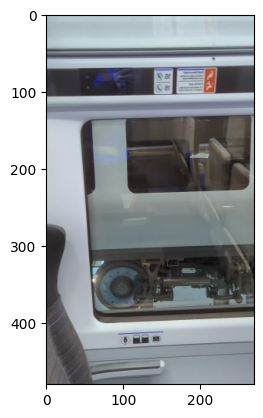

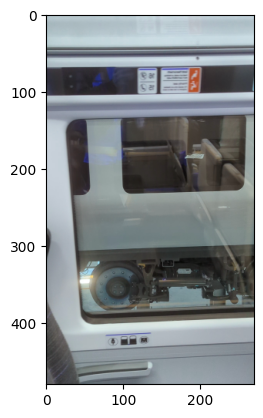

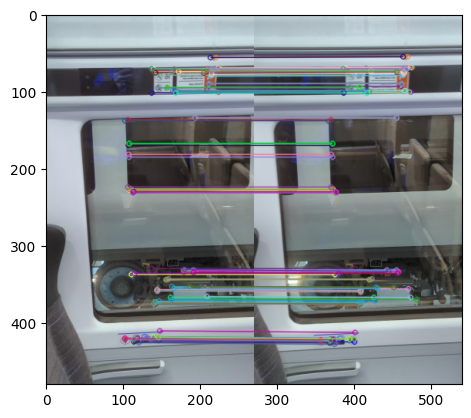

437 450 100


In [89]:
# BELOW IS AN EXAMPLE OPERATION

feature_extractor = 'orb' # one of 'sift', 'surf', 'brisk', 'orb'
feature_matching = 'bf' # either 'bf' or 'knn'

frame1 = skipIms[0]
frame2 = skipIms[2]

plt.imshow(frame1)
plt.show()
plt.imshow(frame2)
plt.show()

kpA, featA = detectAndDescribe(frame1, method=feature_extractor)
kpB, featB = detectAndDescribe(frame2, method=feature_extractor)

if feature_matching == 'bf':
    matches = removeBadMatches(kpA, kpB, matchKeyPointsBF(featA, featB, algo=feature_extractor))
    # matches = matchKeyPointsBF(featA, featB, algo=feature_extractor)
    img3 = cv2.drawMatches(frame1,kpA,frame2,kpB,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
elif feature_matching == 'knn':
    matches = removeBadMatches(kpA, kpB, matchKeyPointsKNN(featA, featB, ratio=0.75, algo=feature_extractor))
    img3 = cv2.drawMatches(frame1,kpA,frame2,kpB,np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

(matches, homo, status) = getHomography(kpA, kpB, matches, reprojThresh=4)
if (matches, homo, status) is None:
    print('no homo :(')

plt.imshow(img3)
plt.show()

result = cv2.warpPerspective(frame2, homo, (frame1.shape[1] + frame2.shape[1], frame1.shape[0] + frame2.shape[0]))
# result[0:frame1.shape[0], 0:frame1.shape[1]] = frame1

# result = warpImages(frame1, frame2, H)

# plt.figure(figsize=(20,10))
# plt.imshow(result)

# plt.axis('off')
# plt.show()

# print(homo)
print(len(kpA), len(kpB), len(matches))

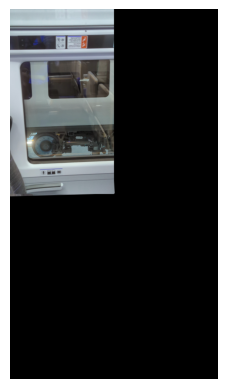

In [14]:
w = frame1.shape[1] + frame2.shape[1]
h = frame1.shape[0] + frame2.shape[0]

result = cv2.warpPerspective(frame1, homo, (w,h))
result[0:frame2.shape[0], 0:frame2.shape[1]] = frame2

plt.imshow(result)
plt.axis('off')
plt.show()

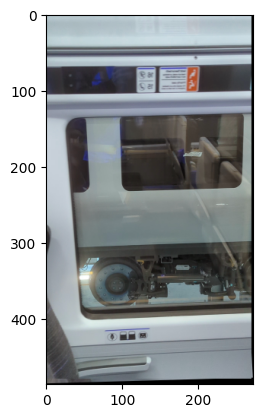

In [15]:
grey = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
# threshold the grey image
thresh = cv2.threshold(grey, 0, 255, cv2.THRESH_BINARY)[1]

# Finds contours from the binary image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# get the maximum contour area
c = max(cnts, key=cv2.contourArea)

# get a bbox from the contour area
(x, y, w, h) = cv2.boundingRect(c)

# crop the image to the bbox coordinates
result = result[y:y + h, x:x + w]

# show the cropped image
plt.imshow(result)
plt.show()

In [99]:
def matchAndStitch(frame1, frame2, extractor, matcher):
    kpA, featA = detectAndDescribe(frame1, method=feature_extractor)
    kpB, featB = detectAndDescribe(frame2, method=feature_extractor)

    if feature_matching == 'bf':
        matches = removeBadMatches(kpA, kpB, matchKeyPointsBF(featA, featB, algo=feature_extractor))
        # matches = matchKeyPointsBF(featA, featB, algo=feature_extractor)
        img3 = cv2.drawMatches(frame1,kpA,frame2,kpB,matches[:100],
                               None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    elif feature_matching == 'knn':
        matches = matchKeyPointsKNN(featA, featB, ratio=0.75, algo=feature_extractor)
        img3 = cv2.drawMatches(frame1,kpA,frame2,kpB,np.random.choice(matches,100),
                               None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    (matches, homo, status) = getHomography(kpA, kpB, matches, reprojThresh=4)
    if any([matches, homo, status]) is None:
        print('no homo :(')

    plt.imshow(img3)
    # plt.show()

    # new image max dimensions
    w = frame1.shape[1] + frame2.shape[1]
    h = frame1.shape[0] + frame2.shape[0]

    # warp to match
    # below not working for some reason
    result = cv2.warpPerspective(frame2, np.linalg.inv(homo), (w,h))

    # plt.imshow(result)
    # plt.axis('off')
    # plt.show()

    # now paste them together
    # result[0:frame2.shape[0], 0:frame2.shape[1]] = frame2
    result[0:frame1.shape[0], 0:frame1.shape[1]] = frame1

    # plt.imshow(result)
    # plt.axis('off')
    # plt.show()

    grey = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY) # create grey result to find contours
    thresh = cv2.threshold(grey, 0, 255, cv2.THRESH_BINARY)[1] # threshold the grey image

    # Find contours
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    c = max(cnts, key=cv2.contourArea) # get the max im area
    (x, y, w, h) = cv2.boundingRect(c) # bounding box
    result = result[y:y + h, x:x + w] # crop result

    return result

In [17]:
# very dumb continually adds to widening panorama
def stitcher(images : list, extractor : str, matcher : str):

    todo = list(images) # copy to preserve list
    completed = []
    currentStitch = None

    while len(completed) < images:

        nextFrame = todo[0]

        if currentStitch is None:
            currentStitch = todo[0]
            nextFrame = todo[1]
            todo.pop(0)

        nextIm = matchAndStitch(currentStitch, nextFrame, extractor, matcher)
        plt.imshow(nextIm)
        plt.axis('off')
        plt.show()

        currentStitch = nextIm
        todo.pop(0)

    print(f'merged {len(completed)} images together')
    return currentStitch

In [18]:
# stitches every 2 images first
def zippedStitcher(images, extractor : str, matcher : str):

    todo = list(images) # copy to preserve list
    completed = []

    zipped = list(zip(todo[::2], todo[1::2]))

    for (frame1, frame2) in zipped:
        nextIm = matchAndStitch(frame1, frame2, extractor, matcher)
        completed.append(nextIm)

    return completed

In [19]:
def imgIterator(ims):
    count = 0
    while count < len(ims):
        yield ims[count]
        count += 1

In [20]:
# built-in stitcher is terrible, do not use, but here's how

# stitcher = cv2.Stitcher_create() # cv2.Stitcher_PANORAMA
# stitcher.setPanoConfidenceThresh(0.4)
# status, stitched = stitcher.stitch(easy)
# if status == 0:
#     plt.imshow(stitched)
#     plt.axis('off')
#     plt.show()
# else:
#     print('built-in stitcher could not stitch :(')

In [21]:
# allLight = preProcessIms(lightFrames[:100])
# current = allLight[0]
#
# for im in allLight[1:]:
#     current = matchAndStitch(current, im, 'sift', 'knn')
# plt.imshow(current)
# plt.axis('off')
# plt.show()

In [22]:
# # weird loop technique doesnt seem to work

# todo = imgIterator( preProcessIms(lightFrames)[:100:3] )
# current = next(todo)
#
# while True:
#     try:
#         current = matchAndStitch(current, next(todo), 'orb', 'bf')
#         plt.imshow(current)
#         plt.axis('off')
#         plt.show()
#     except StopIteration:
#         break

C:\Users\Bazinga\AppData\Local\Temp\ipykernel_11608\3156039900.py:25: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  score = structural_similarity(imgToCompare, currentImage, multichannel=True)


1.0
0.7392416571278773
0.6153073964071728
0.5101760161447132
0.44238050026788883
0.5950157442535002
0.4846653119467092
0.581267197781074
0.44565394075703324
0.6223766819848946
0.4527798596460538
0.4828549529630572
0.4752521775005005
0.4951398148200825
0.5643206654006424
0.487758468330749
0.6261767580720118
0.4394857892811715
0.5934427857060354
0.4362302790393222
0.616503344556738
0.5450672146529206
0.5318434118318307
0.4605348052812947
0.6758423101641026
0.5709512990682483
0.5094689307524589
0.47308170297566116
0.7639574447510732
0.6758631030215426
0.6057839270728759
0.5260731855617914
0.45937912613930165
0.6714618155349497
0.5545159208566435
0.4838332205062173
0.6619545413569338
0.6014614493669438
0.5319301412100582
0.4589360355315651
0.6736366958807625
0.5783399111761774
0.547796356816335
0.48469712146134386
0.6271788291843019
0.4823638239880556
0.6359035714527098
0.5606697528167895
0.5391117810085452
0.44763294197173287
0.6440175024181811
0.4962794777581027
0.6724067644773973
0.5549

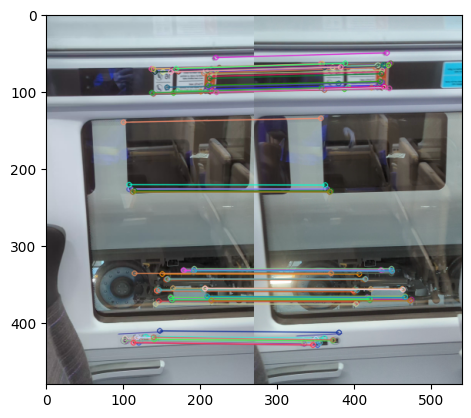

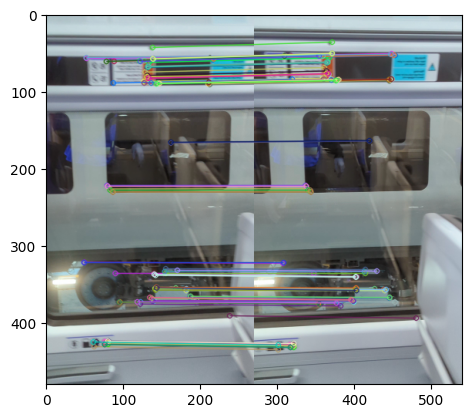

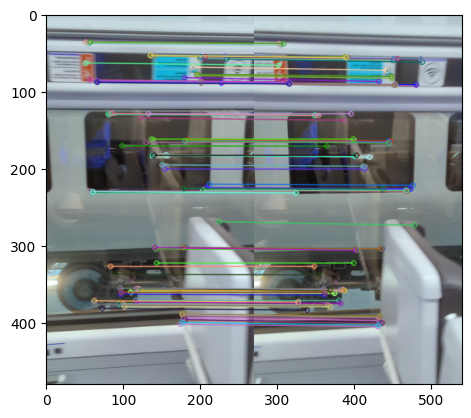

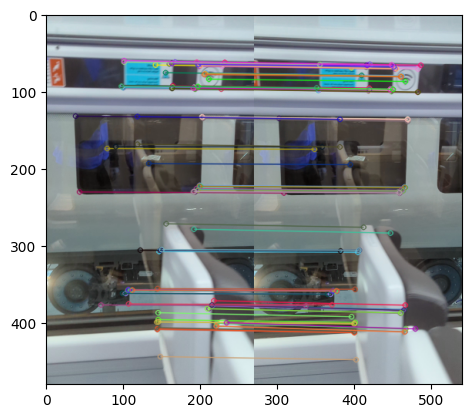

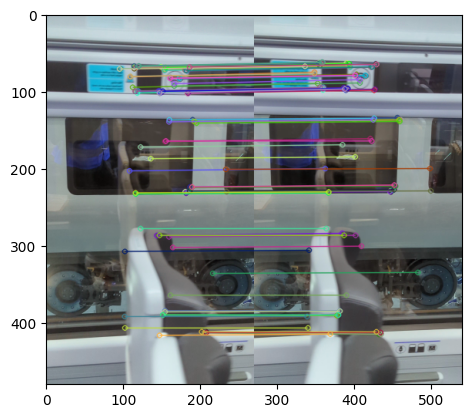

...

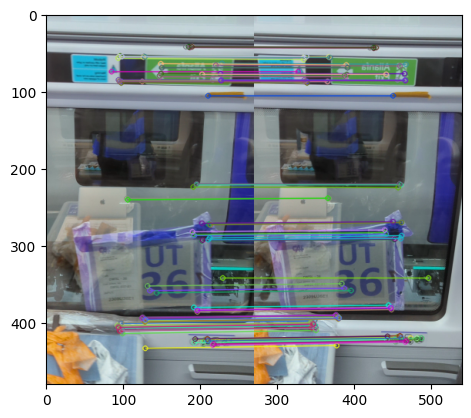

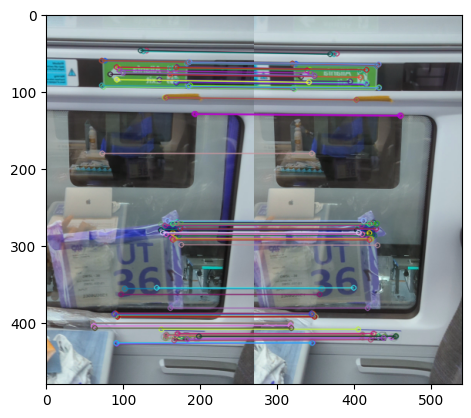

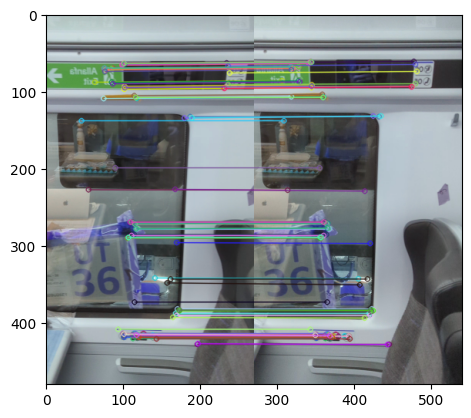

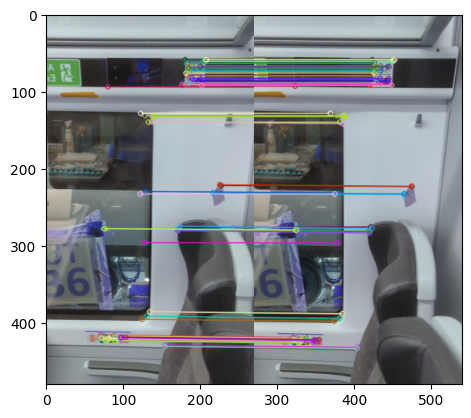

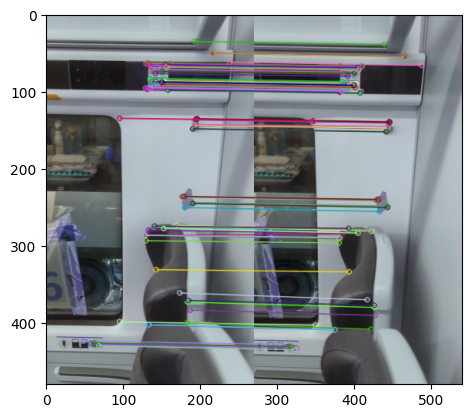

107
19


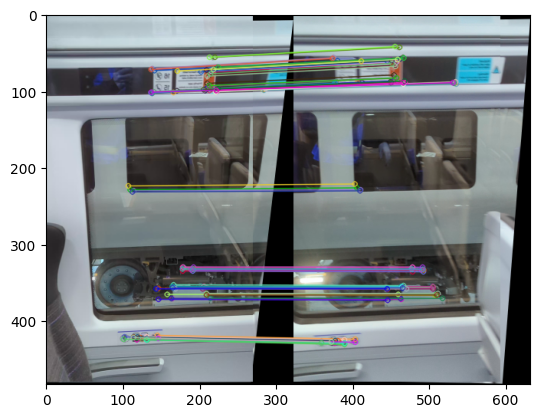

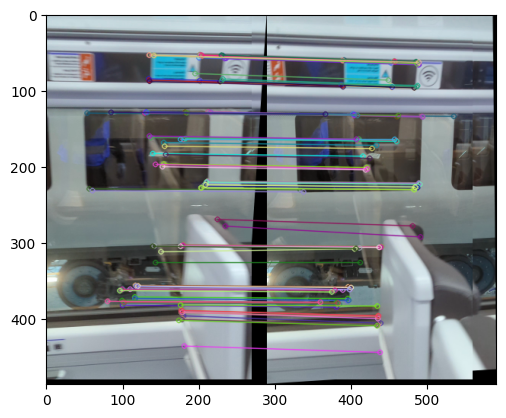

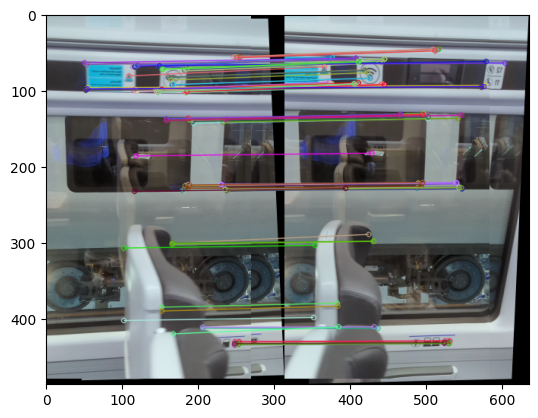

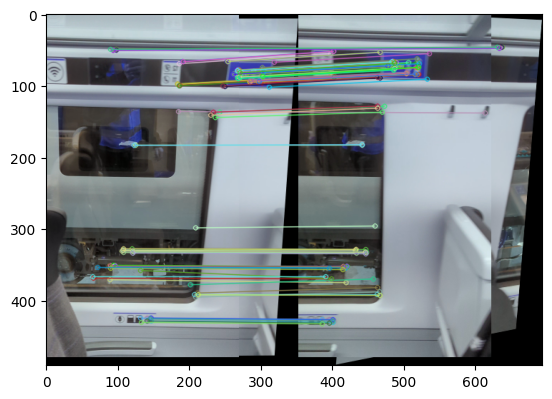

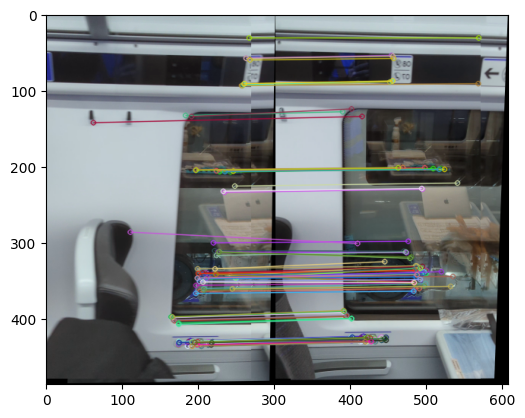

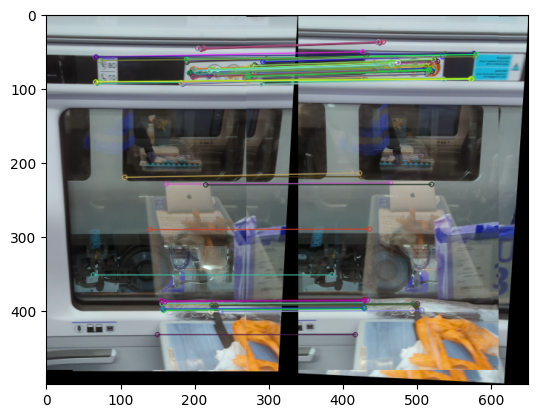

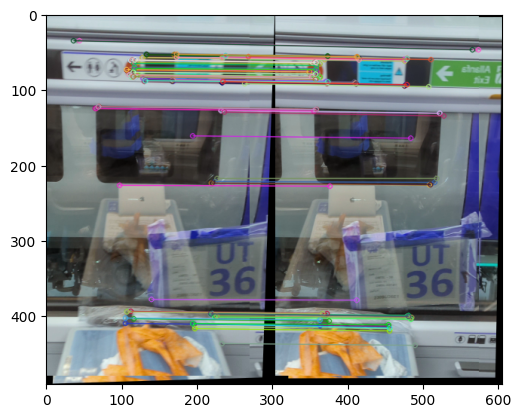

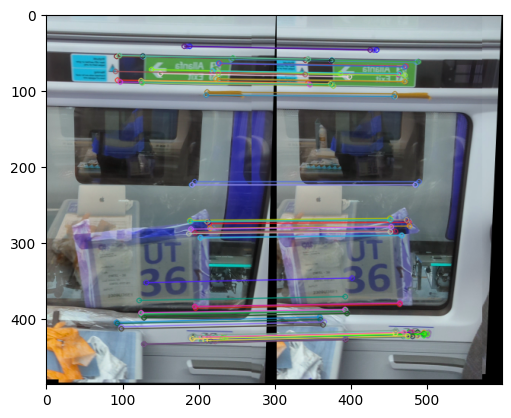

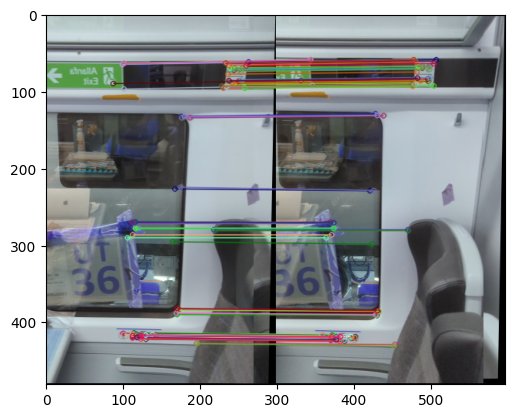

9


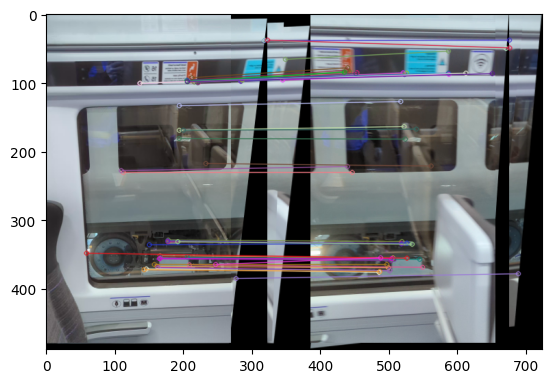

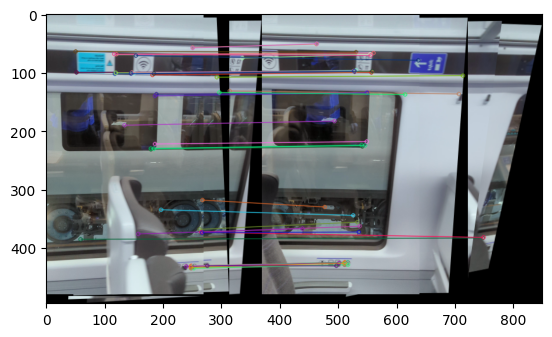

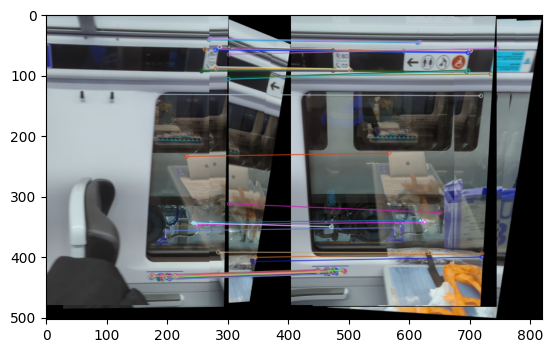

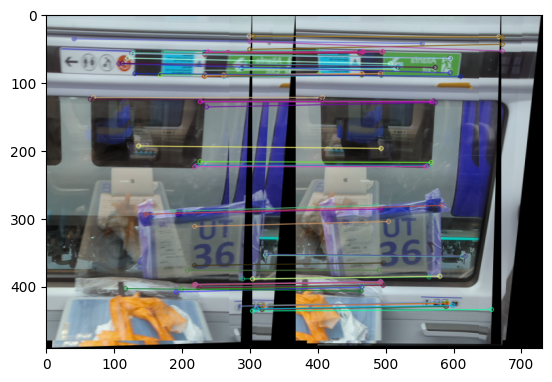

4


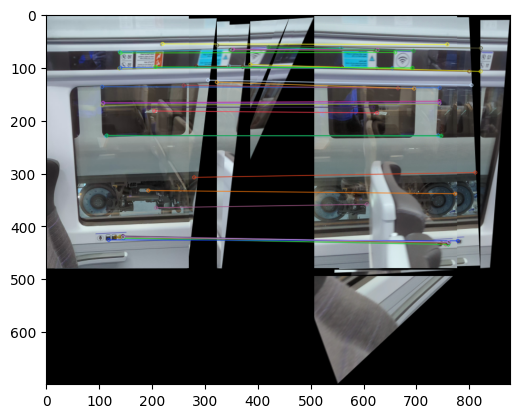

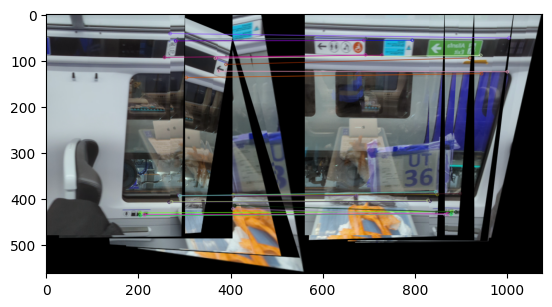

2


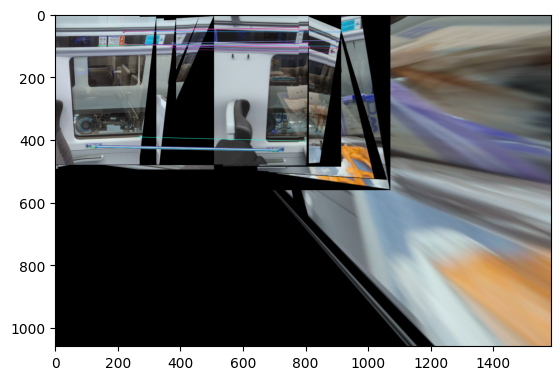

1


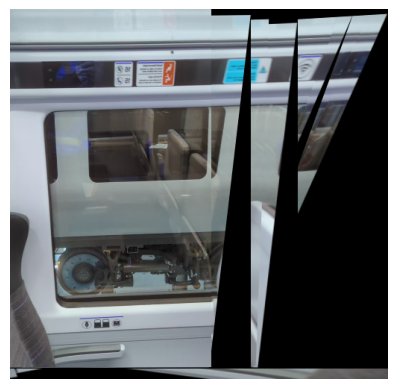

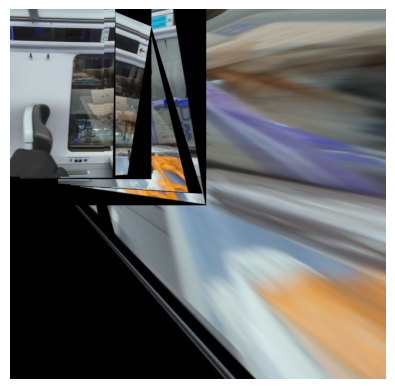

In [116]:
# final = stitcher(skipIms, 'orb', 'bf')
# plt.imshow(final)
# plt.axis('off')
# plt.show()

merged = zippedStitcher( removeSimilarImages(preProcessIms(lightFrames)[::3]) , 'sift', 'knn')
print(len(skipIms))
print(len(merged))

merged2 = zippedStitcher(merged, 'sift', 'knn')
print(len(merged2))

merged3 = zippedStitcher(merged2, 'sift', 'knn')
print(len(merged3))

merged4 = zippedStitcher(merged3, 'sift', 'knn')
print(len(merged4))

merged5 = zippedStitcher(merged4, 'sift', 'knn')
print(len(merged5))

# plt.imshow(merged4[0])
# plt.axis('off')
# plt.show()

for im in merged4:
    plt.imshow(im)
    plt.axis('off')
    plt.show()